In [1]:
import os
import cv2
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt 
from tqdm import tqdm
import keras
from keras import layers
from keras import models
from keras.models import Sequential, Model, load_model
from keras.layers import Input, Dense, Reshape, Flatten, Activation, Concatenate
from keras.layers import ReLU, LeakyReLU, BatchNormalization, Dropout
from keras.layers import Conv2D, Conv2DTranspose, UpSampling2D, ZeroPadding2D
from keras.optimizers import Adam
from keras.initializers import RandomNormal

from IPython import display
from PIL import Image
import time

ImportError: DLL load failed while importing cv2: The specified module could not be found.

In [ ]:
print(tf.__version__)

2.15.0


In [3]:
data_dir = "../input/wikiart/Realism"
# data_dir = "../input/data-art/data_train"
input_dir = "/kaggle/working/datatrain"
os.makedirs(input_dir, exist_ok=True)
output_dir = "/kaggle/working/Output"
os.makedirs(output_dir, exist_ok=True)

In [4]:
# Image parameters
SEED_SIZE = 100
IMG_SIZE = 256
BATCH_SIZE = 64
EPOCHS = 200
LAMBDA = 100
SAVE_FREQ = 25

# define loss function
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [5]:
# preprocess images
def preprocess_image(img, to_sketch=False):
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    if to_sketch:
        gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)  # Chuyển sang ảnh xám
        inverted_img = cv2.bitwise_not(gray_img)  # Tạo ảnh âm bản
        blurred_img = cv2.GaussianBlur(inverted_img, (21, 21), 0)  # Làm mờ ảnh âm bản
        inverted_blurred_img = cv2.bitwise_not(blurred_img)  # Tạo ảnh âm bản của ảnh mờ
        sketch_img = cv2.divide(gray_img, inverted_blurred_img, scale=256.0)  # Tạo ảnh phác họa

        img = np.stack((sketch_img,) * 3, axis=-1)  # Chuyển đổi lại thành 3 kênh màu
    img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))  # Thay đổi kích thước ảnh
    img = img.astype('float32') / 127.5 - 1  # Chuẩn hóa ảnh về khoảng [-1, 1]
    return img


In [6]:
# load and preprocess images
def load_and_preprocess_images(image_dir):
    color_images = []
    sketch_images = []
    count = 0

    for filename in tqdm(sorted(os.listdir(image_dir))):
        if count >= 1500 or count == len(os.listdir(image_dir)):
            break

        img_path = os.path.join(image_dir, filename)
        if os.path.isfile(img_path):
            img = cv2.imread(img_path)
            color_img = preprocess_image(img, to_sketch=False)
            sketch_img = preprocess_image(img, to_sketch=True)
            color_images.append(color_img)
            sketch_images.append(sketch_img)
            count+=1
    return np.array(sketch_images), np.array(color_images)

In [7]:
# Downsample and Upsample blocks
def downsample(filters, size, apply_batchnorm=True):
    initializer = RandomNormal(0., 0.02)
    result = Sequential()
    result.add(Conv2D(filters, size, strides=2, padding='same', kernel_initializer=initializer, use_bias=False))
    if apply_batchnorm:
        result.add(BatchNormalization())
    result.add(LeakyReLU())
    return result

In [8]:
def upsample(filters, size, apply_dropout=False):
    initializer = RandomNormal(0., 0.02)
    result = Sequential()
    result.add(Conv2DTranspose(filters, size, strides=2, padding='same', kernel_initializer=initializer, use_bias=False))
    result.add(BatchNormalization())
    if apply_dropout:
        result.add(Dropout(0.5))
    result.add(ReLU())
    return result

In [9]:
# Discriminator
def Discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)
    inp = Input(shape=(IMG_SIZE, IMG_SIZE, 3), name='input_image')
    tar = Input(shape=(IMG_SIZE, IMG_SIZE, 3), name='target_image')
    x = Concatenate()([inp, tar])
    
    down1 = downsample(64, 4, False)(x)
    down2 = downsample(128, 4)(down1)
    down3 = downsample(256, 4)(down2)
    zero_pad1 = ZeroPadding2D()(down3)
    conv = Conv2D(512, 4, strides=1, kernel_initializer=initializer, use_bias=False)(zero_pad1)
    batchnorm1 = BatchNormalization()(conv)
    leaky_relu = LeakyReLU()(batchnorm1)
    zero_pad2 = ZeroPadding2D()(leaky_relu)
    last = Conv2D(1, 4, strides=1, kernel_initializer=initializer)(zero_pad2)
    
    return Model(inputs=[inp, tar], outputs=last)

In [10]:
# Generator
def Generator():
    inputs = Input(shape=(IMG_SIZE, IMG_SIZE, 3))
    down_stack = [
        downsample(64, 4, apply_batchnorm=False),  # (bs, 128, 128, 64)
        downsample(128, 4),  # (bs, 64, 64, 128)
        downsample(256, 4),  # (bs, 32, 32, 256)
        downsample(512, 4),  # (bs, 16, 16, 512)
        downsample(512, 4),  # (bs, 8, 8, 512)
        downsample(512, 4),  # (bs, 4, 4, 512)
        downsample(512, 4),  # (bs, 2, 2, 512)
        downsample(512, 4),  # (bs, 1, 1, 512)
    ]
    up_stack = [
        upsample(512, 4, apply_dropout=True),  # (bs, 2, 2, 1024)
        upsample(512, 4, apply_dropout=True),  # (bs, 4, 4, 1024)
        upsample(512, 4, apply_dropout=True),  # (bs, 8, 8, 1024)
        upsample(512, 4),  # (bs, 16, 16, 1024)
        upsample(256, 4),  # (bs, 32, 32, 512)
        upsample(128, 4),  # (bs, 64, 64, 256)
        upsample(64, 4),  # (bs, 128, 128, 128)
    ]
    initializer = RandomNormal(0., 0.02)
    last = Conv2DTranspose(3, 4, strides=2, padding='same', kernel_initializer=initializer, activation='tanh')  # (bs, 256, 256, 3)
    x = inputs
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    skips = reversed(skips[:-1])
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = Concatenate()([x, skip])
    x = last(x)
    return Model(inputs=inputs, outputs=x)

In [11]:
def generator_loss(disc_generated_output, gen_output, target):
    gan_loss = cross_entropy(tf.ones_like(disc_generated_output), disc_generated_output)
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))
    total_gen_loss = gan_loss + (LAMBDA * l1_loss)
    return total_gen_loss, gan_loss, l1_loss

In [12]:
def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = cross_entropy(tf.ones_like(disc_real_output), disc_real_output)
    generated_loss = cross_entropy(tf.zeros_like(disc_generated_output), disc_generated_output)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss

In [13]:
def train_step(input_image, target, epoch):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        # Generator output
        gen_output = generator(input_image, training=True)

        # Discriminator output
        disc_real_output = discriminator([input_image, target], training=True)
        disc_generated_output = discriminator([input_image, gen_output], training=True)

        # Generator loss
        gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)

        # Discriminator loss
        disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

    # Calculate gradients
    generator_gradients = gen_tape.gradient(gen_total_loss, generator.trainable_variables)
    discriminator_gradients = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    # Apply gradients
    generator_optimizer.apply_gradients(zip(generator_gradients, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(discriminator_gradients, discriminator.trainable_variables))

    return gen_total_loss, gen_gan_loss, gen_l1_loss, disc_loss

In [14]:
# Training loop
def fit(train_ds, epochs):
    for epoch in range(epochs): 
        start = time.time()
        for input_image, target in train_ds:
            t = train_step(input_image, target, epoch)
            
            gen_total_loss_list.append(t[0])
            gen_gan_loss_list.append(t[1])
            gen_l1_loss_list.append(t[2])
            disc_loss_list.append(t[3])
            
        gen_total_loss_epoch = sum(gen_total_loss_list) / len(gen_total_loss_list)
        gen_gan_loss_epoch = sum(gen_gan_loss_list) / len(gen_gan_loss_list)
        gen_l1_loss_epoch = sum(gen_l1_loss_list) / len(gen_l1_loss_list)
        disc_loss_epoch = sum(disc_loss_list) / len(disc_loss_list)

        # Print losses for each epoch
        print(f'Epoch {epoch + 1}, '
              f'Gen Total Loss: {gen_total_loss_epoch}, '
              f'Gen GAN Loss: {gen_gan_loss_epoch}, '
              f'Gen L1 Loss: {gen_l1_loss_epoch}, '
              f'Disc Loss: {disc_loss_epoch}')

#         # Save generated images
#         for example_input, example_target in train_ds.take(1):
#             generate_images(generator, example_input, example_target)

        print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1,
                                                            time.time()-start))

        # Save checkpoint and images every save_every_n_epochs epochs
        if (epoch + 1) % SAVE_FREQ == 0:
            checkpoint.save(file_prefix=checkpoint_prefix)
            save_images(generator, example_sketch, example_color, epoch + 1, output_dir)

In [15]:
# Function to save images
def save_images(model, test_input, tar, epoch, output_dir):
    prediction = model(test_input, training=False)
    plt.figure(figsize=(15, 15))

    display_list = [test_input[0], tar[0], prediction[0]]
    title = ['Input Image', 'Ground Truth', 'Predicted Image']

    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(title[i])
        # Getting the pixel values in the range [0, 1] to [0, 255] to visualize better
        plt.imshow((display_list[i] * 0.5 + 0.5) * 255.0)
        plt.axis('off')
    plt.savefig(os.path.join(output_dir, 'image_at_epoch_{:04d}.png'.format(epoch)))
    plt.close()

In [16]:
# Generate and save images
def generate_images(model, test_input, tar):
    prediction = model(test_input, training=True)
    plt.figure(figsize=(15, 15))
    display_list = [test_input[0], tar[0], prediction[0]]
    title = ['Input Image', 'Ground Truth', 'Predicted Image']
    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(title[i])
        plt.imshow((display_list[i] * 0.5 + 0.5))
        plt.axis('off')
    plt.show()

In [17]:
# Optimizers
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [18]:
sketch_images, color_images = load_and_preprocess_images(data_dir)

# Create TensorFlow datasets
dataset = tf.data.Dataset.from_tensor_slices((sketch_images, color_images)).batch(BATCH_SIZE)

 14%|█▍        | 1500/10733 [01:44<10:43, 14.34it/s]


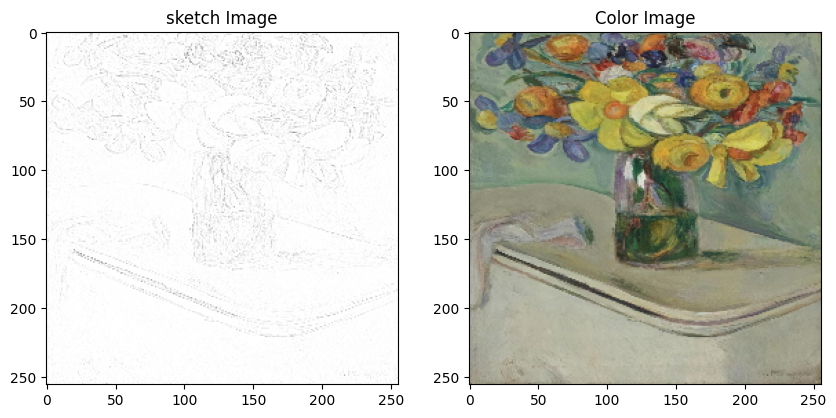

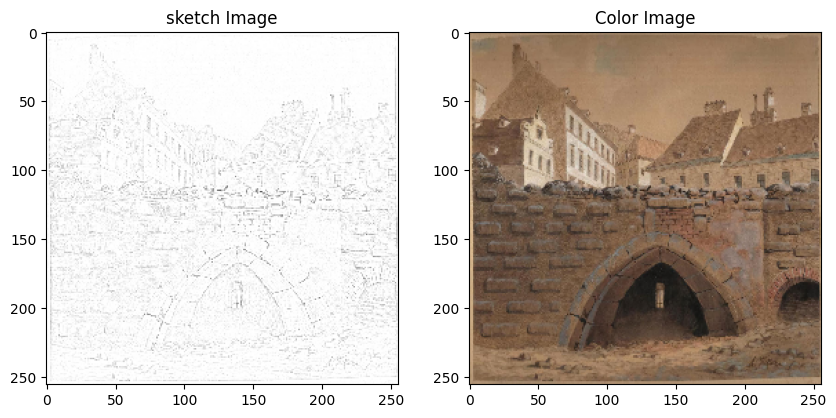

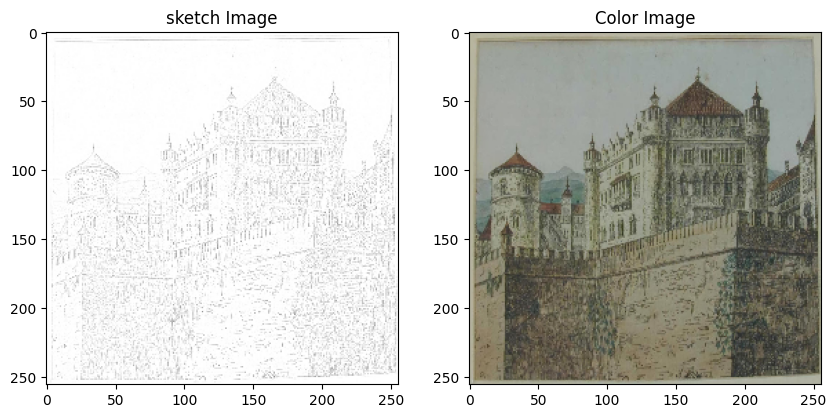

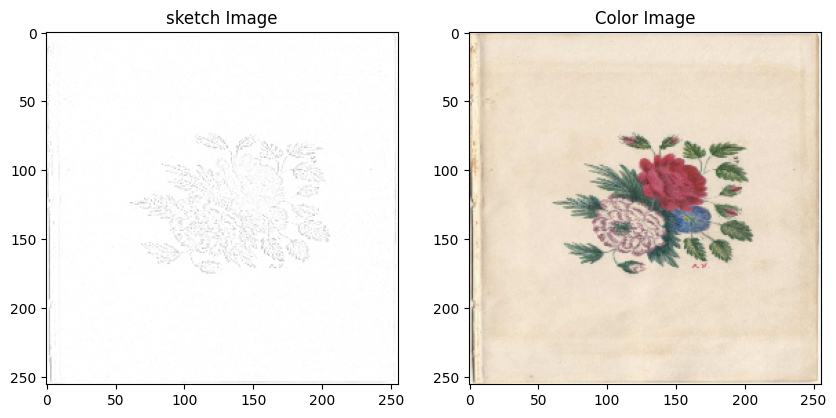

In [19]:
# Plot some examples
example_sketch, example_color = next(iter(dataset))
def plot_images(sketch_images, color_images, num_images=4):
    for i in range(num_images):
        plt.figure(figsize=(10, 5))
        plt.subplot(1, 2, 1)
        plt.title('sketch Image')
        plt.imshow((sketch_images[i] * 0.5 + 0.5).numpy().astype(np.float32))  # De-normalize and display
        plt.subplot(1, 2, 2)
        plt.title('Color Image')
        plt.imshow((color_images[i] * 0.5 + 0.5).numpy().astype(np.float32))  # De-normalize and display
        plt.show()

plot_images(example_sketch, example_color)

In [20]:
generator = Generator()
generator.compile(loss='binary_crossentropy', optimizer=generator_optimizer)
generator.summary()

Model: "functional_16"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential          │ (None, 128, 128,  │      3,072 │ input_layer[0][0] │
│ (Sequential)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_1        │ (None, 64, 64,    │    131,584 │ sequential[0][0]  │
│ (Sequential)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_2        │ (None, 32, 32,    │    525,312 │ sequential_1[0][… │
│ (Sequential)        │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_3        │ (None, 16, 16,    │  2,099,200 │ sequential_2[0][… │
│ (Sequential)        │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_4        │ (None, 8, 8, 512) │  4,196,352 │ sequential_3[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_5        │ (None, 4, 4, 512) │  4,196,352 │ sequential_4[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_6        │ (None, 2, 2, 512) │  4,196,352 │ sequential_5[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_7        │ (None, 1, 1, 512) │  4,196,352 │ sequential_6[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_8        │ (None, 2, 2, 512) │  4,196,352 │ sequential_7[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 2, 2,      │          0 │ sequential_8[0][… │
│ (Concatenate)       │ 1024)             │            │ sequential_6[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_9        │ (None, 4, 4, 512) │  8,390,656 │ concatenate[0][0] │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_1       │ (None, 4, 4,      │          0 │ sequential_9[0][… │
│ (Concatenate)       │ 1024)             │            │ sequential_5[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_10       │ (None, 8, 8, 512) │  8,390,656 │ concatenate_1[0]… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_2       │ (None, 8, 8,      │          0 │ sequential_10[0]… │
│ (Concatenate)       │ 1024)             │            │ sequential_4[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_11       │ (None, 16, 16,    │  8,390,656 │ concatenate_2[0]… │
│ (Sequential)        │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_3       │ (None, 16, 16,    │          0 │ sequential_11[0]

 Total params: 54,425,859 (207.62 MB)

 Trainable params: 54,414,979 (207.58 MB)

 Non-trainable params: 10,880 (42.50 KB)

In [21]:
discriminator = Discriminator()
discriminator.compile(loss='binary_crossentropy', optimizer=discriminator_optimizer)
discriminator.summary()

Model: "functional_21"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_image         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ target_image        │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_7       │ (None, 256, 256,  │          0 │ input_image[0][0… │
│ (Concatenate)       │ 6)                │            │ target_image[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_15       │ (None, 128, 128,  │      6,144 │ concatenate_7[0]… │
│ (Sequential)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_16       │ (None, 64, 64,    │    131,584 │ sequential_15[0]… │
│ (Sequential)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_17       │ (None, 32, 32,    │    525,312 │ sequential_16[0]… │
│ (Sequential)        │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d      │ (None, 34, 34,    │          0 │ sequential_17[0]… │
│ (ZeroPadding2D)     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_11 (Conv2D)  │ (None, 31, 31,    │  2,097,152 │ zero_padding2d[0… │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 31, 31,    │      2,048 │ conv2d_11[0][0]   │
│ (BatchNormalizatio… │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_11      │ (None, 31, 31,    │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_1    │ (None, 33, 33,    │          0 │ leaky_re_lu_11[0… │
│ (ZeroPadding2D)     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_12 (Conv2D)  │ (None, 30, 30, 1) │      8,193 │ zero_padding2d_1… │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 2,770,433 (10.57 MB)

 Trainable params: 2,768,641 (10.56 MB)

 Non-trainable params: 1,792 (7.00 KB)

In [22]:
# Directory for storing checkpoints
checkpoint_dir = './training_checkpoints'
os.makedirs(checkpoint_dir, exist_ok=True)
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")

# Define the checkpoint
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

In [23]:
gen_total_loss_list = []
gen_gan_loss_list = []
gen_l1_loss_list = []
disc_loss_list = []

fit(dataset, EPOCHS)

Epoch 1, Gen Total Loss: 35.62974166870117, Gen GAN Loss: 0.9313650131225586, Gen L1 Loss: 0.34698376059532166, Disc Loss: 1.5242067575454712
Time taken for epoch 1 is 63.55491232872009 sec

Epoch 2, Gen Total Loss: 33.492549896240234, Gen GAN Loss: 1.0403856039047241, Gen L1 Loss: 0.32452163100242615, Disc Loss: 1.3304308652877808
Time taken for epoch 2 is 37.60242986679077 sec

Epoch 3, Gen Total Loss: 32.45396423339844, Gen GAN Loss: 1.1229487657546997, Gen L1 Loss: 0.31331005692481995, Disc Loss: 1.1927165985107422
Time taken for epoch 3 is 37.61709523200989 sec

Epoch 4, Gen Total Loss: 31.854238510131836, Gen GAN Loss: 1.1505106687545776, Gen L1 Loss: 0.30703720450401306, Disc Loss: 1.1507585048675537
Time taken for epoch 4 is 37.53658843040466 sec

Epoch 5, Gen Total Loss: 31.33573341369629, Gen GAN Loss: 1.1474297046661377, Gen L1 Loss: 0.3018830120563507, Disc Loss: 1.1384257078170776
Time taken for epoch 5 is 37.588502407073975 sec

Epoch 6, Gen Total Loss: 30.86236572265625,

In [83]:
os.makedirs('/kaggle/working/model', exist_ok=True)
generator_file = '/kaggle/working/model/cgan_generator.h5'
generator.save(generator_file)

In [25]:
def preprocess_test_image(image_path):
    image = Image.open(image_path).convert('RGB')  # Đảm bảo ảnh có 3 kênh
    image = image.resize((IMG_SIZE, IMG_SIZE))
    image = np.array(image).astype(np.float32)
    image = (image / 127.5) - 1  # Chuẩn hóa ảnh về khoảng [-1, 1]
    return image

In [26]:
def generate_image(generator, input_image):
    input_image = tf.expand_dims(input_image, 0)  # Thêm batch dimension
    generated_image = generator(input_image, training=False)[0]  # Chuyển đổi từ [-1, 1] về [0, 1]
    generated_image = (generated_image + 1) / 2
    return generated_image

In [27]:
def show_and_save_images(original_image, generated_image, save_path):
    plt.figure(figsize=(10, 5))
    
    # Hiển thị ảnh gốc
    plt.subplot(1, 2, 1)
    plt.title("Original Image")
    plt.imshow((original_image + 1) / 2)  # Chuyển đổi từ [-1, 1] về [0, 1]
    plt.axis('off')

    # Hiển thị ảnh sinh ra
    plt.subplot(1, 2, 2)
    plt.title("Generated Image")
    plt.imshow(generated_image)  # Ảnh đã ở khoảng [0, 1]
    plt.axis('off')

    plt.show()

    # Lưu ảnh sinh ra
    generated_image = (generated_image * 255).numpy().astype(np.uint8)
    Image.fromarray(generated_image).save(save_path)

In [28]:
def load_show_and_save_images(generator, test_folder, save_folder):
    if not os.path.exists(save_folder):
        os.makedirs(save_folder)
    
    for image_name in os.listdir(test_folder):
        image_path = os.path.join(test_folder, image_name)
        
        # Đọc và tiền xử lý ảnh đầu vào
        original_image = preprocess_test_image(image_path)
        
        # Sinh ảnh từ model generator
        generated_image = generate_image(generator, original_image)
        
        # Hiển thị và lưu ảnh
        save_path = os.path.join(save_folder, 'generated_' + image_name)
        show_and_save_images(original_image, generated_image, save_path)

In [29]:
# def load_and_generate_images(generator, test_folder, save_folder):
#     if not os.path.exists(save_folder):
#         os.makedirs(save_folder)
    
#     for image_name in os.listdir(test_folder):
#         image_path = os.path.join(test_folder, image_name)
#         input_image = preprocess_test_image(image_path)
#         input_image = tf.expand_dims(input_image, 0)  # Thêm batch dimension
#         generate_and_save_test_images(generator, input_image, save_folder, image_name)

In [30]:
generator = tf.keras.models.load_model(generator_file)

In [31]:
test_folder = "../input/test-data/fake"
save_folder = "/kaggle/working/output_test"
# os.makedirs(save_folder, exist_ok=True)
# load_and_generate_images(generator, test_folder, save_folder)

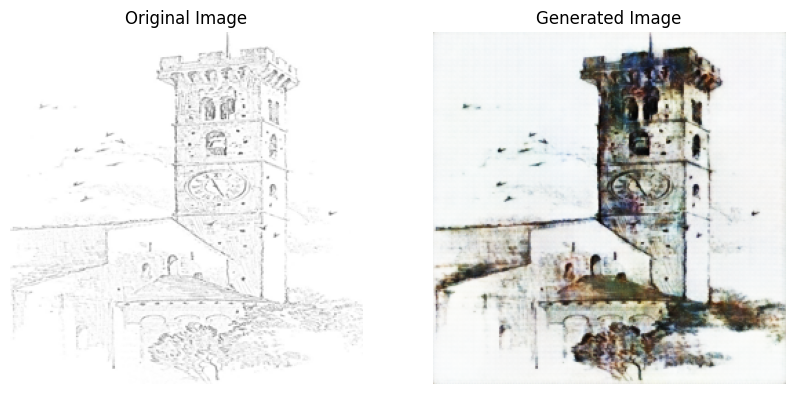

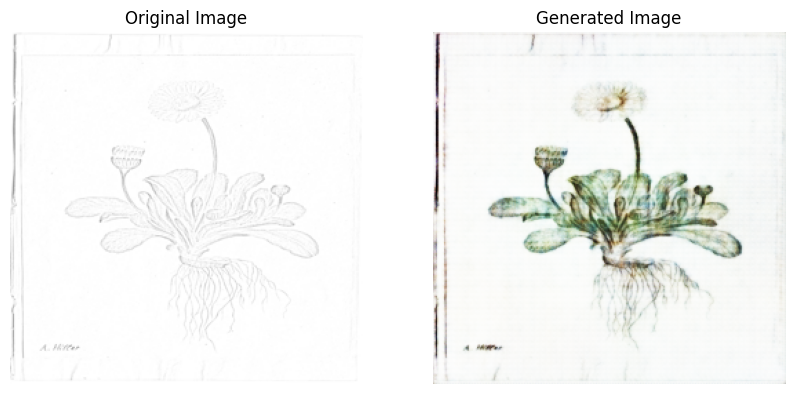

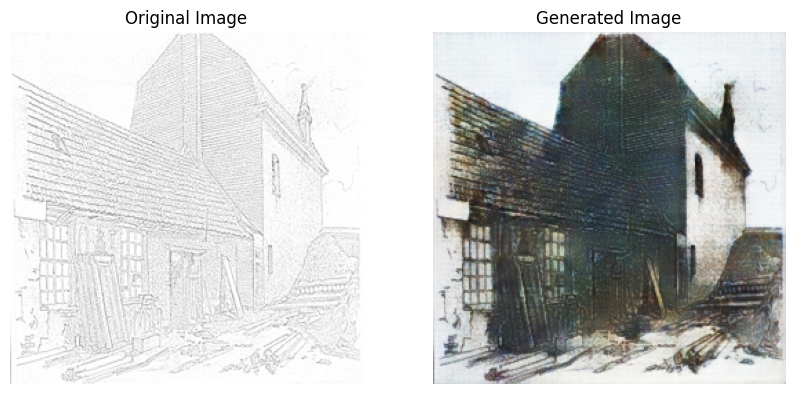

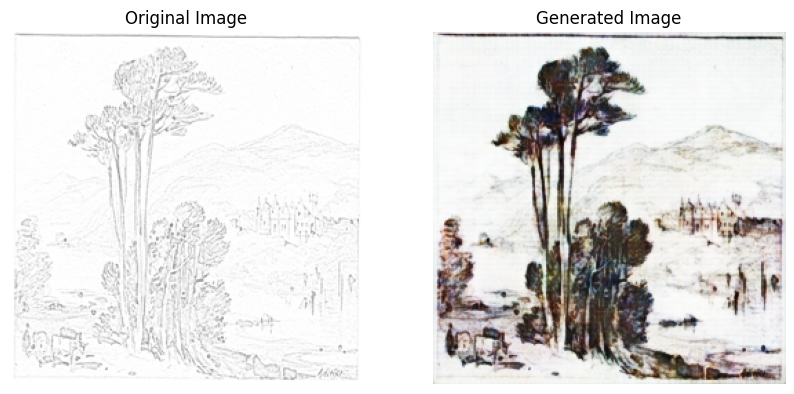

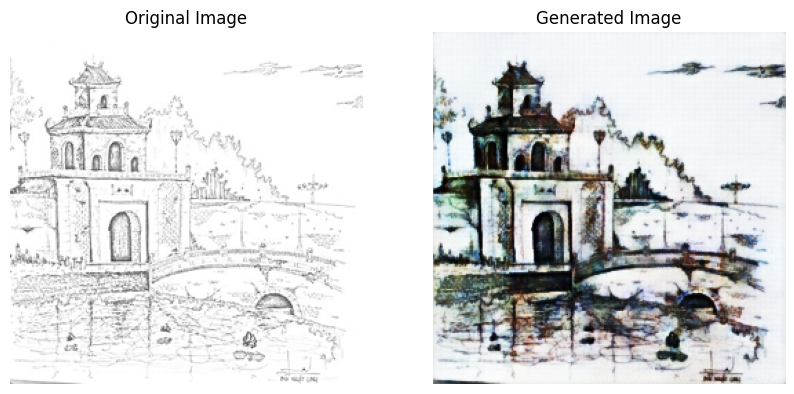

...

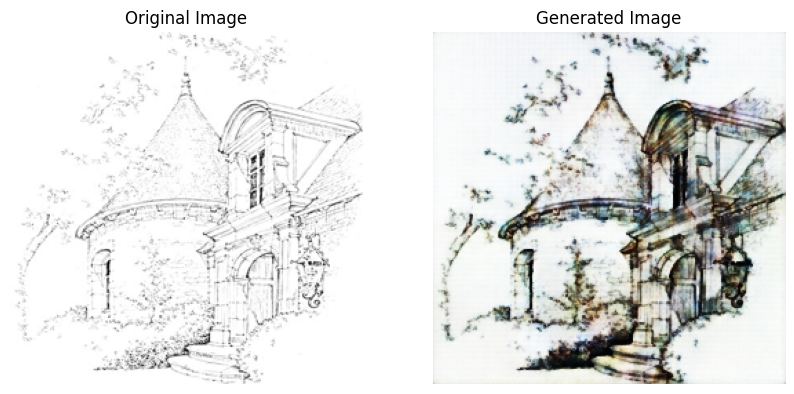

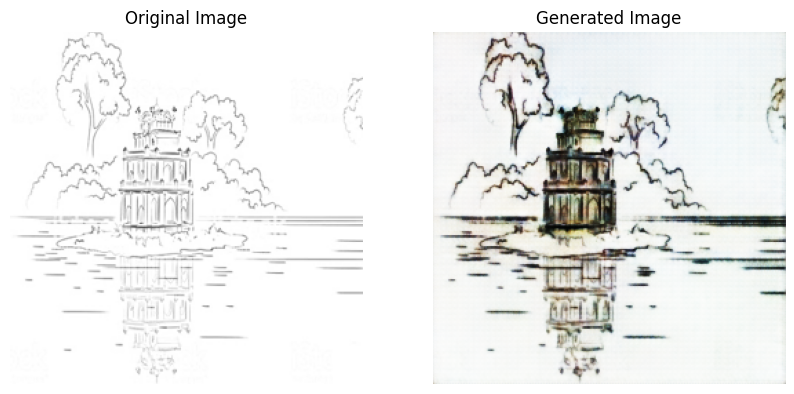

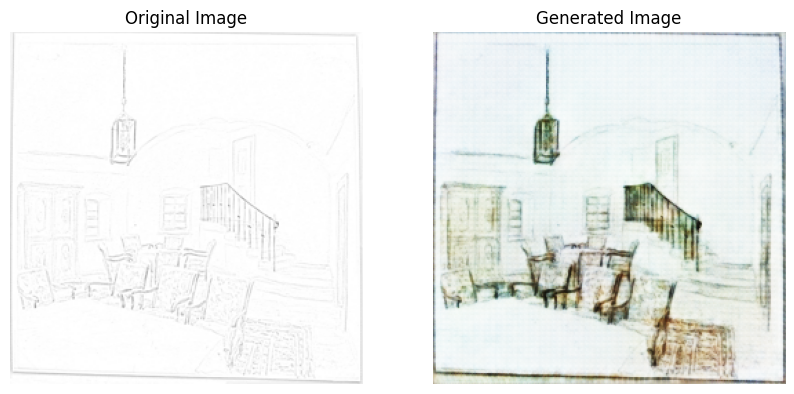

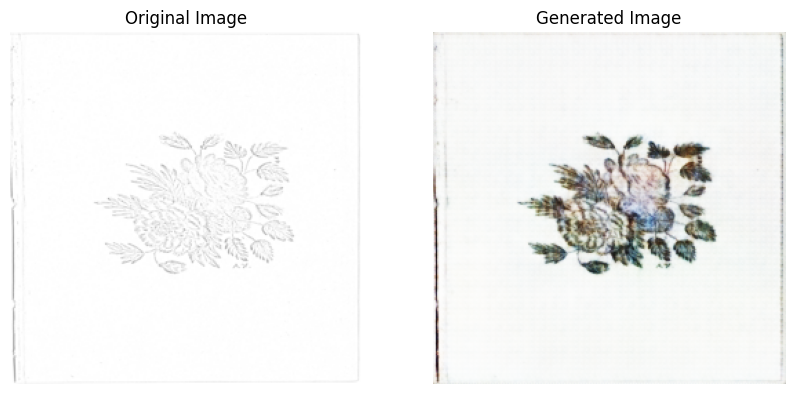

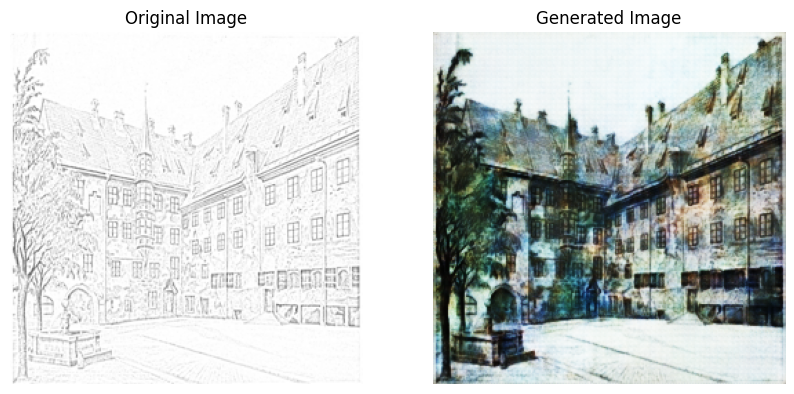

In [32]:
load_show_and_save_images(generator, test_folder, save_folder)

In [33]:
import os
import numpy as np
import tensorflow as tf
from scipy.linalg import sqrtm
from keras.applications.inception_v3 import InceptionV3, preprocess_input
from PIL import Image

# Định nghĩa kích thước ảnh đầu vào cho generator
IMG_SIZE = 256


def preprocess_test_image(image_path):
    image = Image.open(image_path).convert('RGB')  # Đảm bảo ảnh có 3 kênh
    image = image.resize((IMG_SIZE, IMG_SIZE))
    image = np.array(image).astype(np.float32)
    image = (image / 127.5) - 1  # Chuẩn hóa ảnh về khoảng [-1, 1]
    return image


def generate_image(generator, input_image):
    # Thay đổi kích thước của ảnh đầu vào
    input_image_resized = tf.image.resize(input_image, (256, 256))
    input_image_resized = tf.expand_dims(input_image_resized, 0)  # Thêm chiều batch
    generated_image = generator(input_image_resized, training=False)[0]
    return generated_image



def calculate_fid_pix2pix(real_activations, fake_activations):
    # Calculate mean and covariance statistics
    mu_real, sigma_real = np.mean(real_activations, axis=0), np.cov(real_activations, rowvar=False)
    mu_fake, sigma_fake = np.mean(fake_activations, axis=0), np.cov(fake_activations, rowvar=False)

    # Calculate squared difference between means
    diff_mean = np.sum((mu_real - mu_fake) ** 2)

    # Calculate squared root of matrix product of covariances
    cov_mean = sqrtm(sigma_real.dot(sigma_fake))
    if np.iscomplexobj(cov_mean):
        cov_mean = cov_mean.real

    # Calculate FID
    fid = diff_mean + np.trace(sigma_real + sigma_fake - 2 * cov_mean)

    return fid


def evaluate_generator_FID(generator, test_images):
    # Load InceptionV3 model pretrained on ImageNet
    inception_model = InceptionV3(include_top=False, pooling='avg', input_shape=[299, 299, 3])

    real_activations = []
    fake_activations = []


    # Tính toán kích hoạt cho ảnh thật
    for image in test_images:
        original_image_resized = tf.image.resize(image, (299, 299))
        expanded_image = np.expand_dims(original_image_resized, axis=0).copy()  # Tạo bản sao trước khi thay đổi
        real_activations.append(inception_model.predict(preprocess_input(expanded_image)))

    real_activations = np.concatenate(real_activations, axis=0)

    # Tính toán kích hoạt cho ảnh giả
    for image in test_images:
        generated_image = generate_image(generator, image)
        expanded_image = np.expand_dims(generated_image, axis=0).copy()  # Tạo bản sao trước khi thay đổi
        fake_activations.append(inception_model.predict(preprocess_input(expanded_image)))

    fake_activations = np.concatenate(fake_activations, axis=0)

    # Calculate FID
    fid = calculate_fid_pix2pix(real_activations, fake_activations)

    return fid


def load_images_from_folder(folder_path):
    images = []
    count = 0
    for filename in os.listdir(folder_path):
        if count >= 100:
            break
        img_path = os.path.join(folder_path, filename)
        if os.path.isfile(img_path):
            image = preprocess_test_image(img_path)
            images.append(image)
            count += 1
    return images


test_folder = '../input/wikiart/Realism'
# Tải ảnh từ thư mục test
test_images = load_images_from_folder(test_folder)
fid = evaluate_generator_FID(generator, test_images)

87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


I0000 00:00:1715887435.149192     110 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━

In [84]:
generator_path = '/kaggle/working/model/cgan_generator.h5'
generator.save(generator_path)

In [78]:
print("Fréchet Inception Distance:", fid)

Fréchet Inception Distance: 117.85714285714286
